# Capstone Project - AMAZONAS STATE FIRES IN 2020 (Jan to Oct)
### Applied Data Science Capstone by IBM/Coursera
<i> Sylvia Ferreira - 2020 <i>

## Table of Contents

1. [Introduction](#1)<br>
2. [Data](#2)<br>
3. [Methodology](#3) <br>
4. [Results and Discussion](#4) <br>
5. [Conclusion](#5) <br>


## Introduction & Business Problem <a id="1"></a>

The number of fires incidents in Brazil's northern region, where the Brazilian Amazon located, has increased. The composition of the area known as the Legal Amazon is composed of all the States of Acre, Amapá, Amazonas, Mato Grosso, Pará, Rondônia, Roraima and Tocantins and part of Maranhão (the largest is Amazonas's state, the focus of this study). These states are in the north and northeast of the country.  From 2019 to 2020, **INPE** (National Institute for Space Research) identified an increase of approximately 20% in the fires.  
This study aims to identify the fires in this state and observe the risks to the urban population as like the amazon biome. In parallel, keeping the association of days without day and the fire risks in this study as the effects of FRP increasing and how IBAMA inspection and fines for criminal fire infractions could positively strike the fire risks. 

## Data <a id="2"></a>

IBAMA and INPE have open sources of data to research the Brazilian biome and human impacts over it. They are combined with the IBGE data to identify the estimated population in this state. With this data can see how near of high population regions the fire was. 

Datasets: 

1. IBAMA's dataset attributes of the infraction notice registered in the inspection system. Will be filtered the infraction occurred in 2020. (https://dados.gov.br/dataset/autos-de-infracao/resource/651feed4-cacb-4316-9353-49f571875fb6)  

2. INPE's fires dataset (http://queimadas.dgi.inpe.br/queimadas/bdqueimadas). Was picked all the satellites and filtered Amazonas state (AM). Those data have fire risks, days without rain, FRP, and fire risks taxes. 

3. IBGE's populations 2020 estimative (https://www.ibge.gov.br/estatisticas/sociais/populacao/9103-estimativas-de-populacao.html?=&t=resultados) published official in the government dataset. 

4. Additional data to mark micro and macro-regions of Amazonas state. We obtained on Wikipedia to identify according to each city their respective region. (https://pt.wikipedia.org/wiki/Lista_de_munic%C3%ADpios_do_Amazonas_por_popula%C3%A7%C3%A3o , https://pt.wikipedia.org/wiki/Lista_de_mesorregi%C3%B5es_e_microrregi%C3%B5es_do_Amazonas , https://pt.wikipedia.org/wiki/Lista_de_munic%C3%ADpios_do_Amazonas )

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from sklearn import metrics
from matplotlib.ticker import NullFormatter
from sklearn import preprocessing
import itertools
%matplotlib inline

In [2]:
!conda install -c conda-forge pydotplus -y
!conda install -c conda-forge python-graphviz -y

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.9.1
  latest version: 4.9.2

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - pydotplus


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2020.11.8  |       ha878542_0         145 KB  conda-forge
    certifi-2020.11.8          |   py36h5fab9bb_0         150 KB  conda-forge
    pydotplus-2.0.2            |     pyhd1c1de3_3          23 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         318 KB

The following NEW packages will be INSTALLED:

  pydotplus          conda-forge/noarch::pydotplus-2.0.2-pyhd1c1de3_3

The following packages will be UPDATED:

 

### Fires analysis

After download INPE's dataset, let's analyze fire risks, although the months and identify the relationship between days without rain and fire risks. Also, the FRP indicator demonstrates the effects of critical fire risks.

In [193]:
path = 'data/TB_FOCOS_20.csv'
df = pd.read_csv(path, sep=';')
df.head(3)

,datahora,satelite,pais,estado,município,bioma,diasemchuva,precipitacao,riscofogo,latitude,longitude,frp,Pop,Mesorregião,Microrregião
0,02/01/2020 17:35,AQUA_M-T,Brasil,AMAZONAS,COARI,Amazonia,0.0,0.1,0.0,-4.354,-63.358,7.8,85097,Centro,Coari
1,02/01/2020 17:35,AQUA_M-T,Brasil,AMAZONAS,COARI,Amazonia,0.0,0.2,-999.0,-4.097,-63.137,10.4,85097,Centro,Coari
2,03/01/2020 18:20,AQUA_M-T,Brasil,AMAZONAS,SAO GABRIEL DA CACHOEIRA,Amazonia,3.0,0.3,0.1,0.501,-67.291,14.3,45564,Norte,Rio Negro


In [194]:
df.dtypes

datahora         object
satelite         object
pais             object
estado           object
município        object
bioma            object
diasemchuva     float64
precipitacao    float64
riscofogo       float64
latitude        float64
longitude       float64
frp             float64
Pop               int64
Mesorregião      object
Microrregião     object
dtype: object

In [195]:
df['datahora'] = pd.to_datetime(df['datahora'])

In [196]:
df['MÊS'] = df['datahora'].dt.month
df['ANO'] = df['datahora'].dt.year
df['SEMANA'] = df['datahora'].dt.weekday
df['HORA'] = df['datahora'].dt.hour

In [199]:
df = df[df["ANO"] == 2020]

In [200]:
df = df[df["MÊS"] < 11]

Let's observe days without rain through the months:

No handles with labels found to put in legend.


Text(0, 0.5, 'Days')

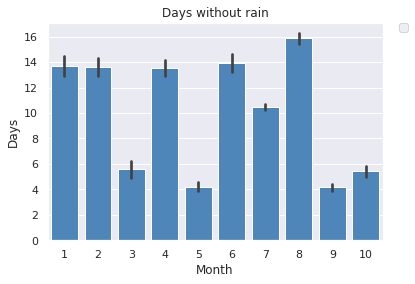

In [201]:
sns.barplot(x="MÊS", y="diasemchuva", color = "#3D87CB", data=df)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Days without rain')
plt.xlabel('Month')
plt.ylabel('Days')

Will be applied the fire risk groups according to INPE's classification: 

In [202]:
def get_status(df):
    if df['riscofogo'] < 0.15 :
        return "Minimum"
    
    elif df['riscofogo'] > 0.15 and df['riscofogo']  < 0.4:
        return "Low"
    
    elif df['riscofogo'] > 0.4 and df['riscofogo'] < 0.7:
        return "Medium"
    
    elif df['riscofogo'] > 0.7 and df['riscofogo'] < 0.95:
        return "High"    
    
    elif df['riscofogo'] > 0.95:
        return "Critical"  
    
    else:
        return "Critical"

df['Nivel_RiscoFogo'] = df.apply(get_status, axis = 1)

Then, the classification plotted with days without rain appoints the relation between both events. 

Text(12.334999999999994, 0.5, 'Days withou rain')

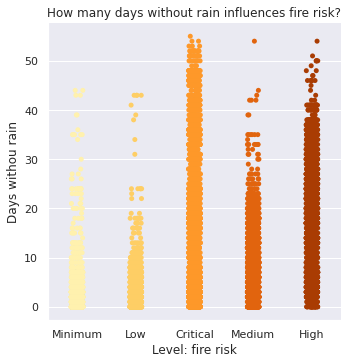

In [203]:
sns.catplot(x="Nivel_RiscoFogo", y="diasemchuva", palette= "YlOrBr", data=df)
plt.title('How many days without rain influences fire risk?')
plt.xlabel('Level: fire risk')
plt.ylabel('Days withou rain')

Text(0, 0.5, 'Days')

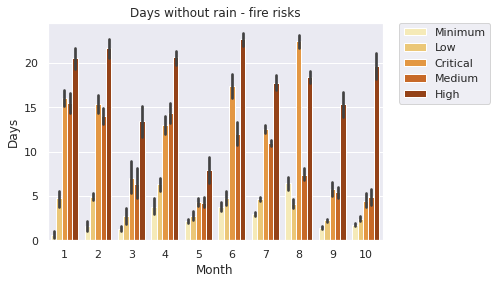

In [204]:
sns.barplot(x="MÊS", y="diasemchuva", palette="YlOrBr",  hue="Nivel_RiscoFogo", data=df)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Days without rain - fire risks')
plt.xlabel('Month')
plt.ylabel('Days')

### FRP

**Fire Radiative Power (FRP)** is the rate of emitted radiative energy by the fire at the time of the observation. Then greater is the FRP, most affected by the fire the biome is. 

Text(0, 0.5, 'FRP (fire radiative power)')

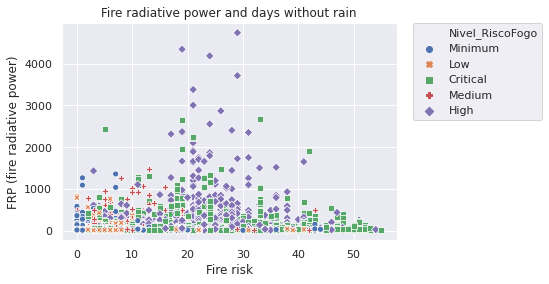

In [205]:
sns.set(style="darkgrid")
sns.scatterplot(data=df, x="diasemchuva", y="frp", style="Nivel_RiscoFogo", hue="Nivel_RiscoFogo")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Fire radiative power and days without rain')
plt.xlabel('Fire risk')
plt.ylabel('FRP (fire radiative power)')

Text(0, 0.5, 'FRP')

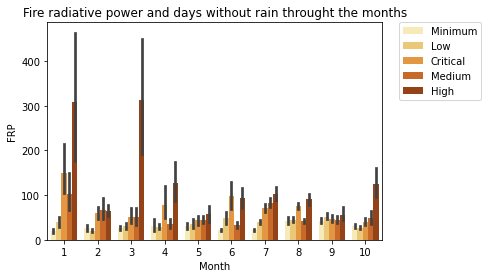

In [41]:
sns.barplot(x="MÊS", y="frp", hue="Nivel_RiscoFogo", palette="YlOrBr", data=df)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Fire radiative power and days without rain throught the months')
plt.xlabel('Month')
plt.ylabel('FRP')

Isolating Critical fire risks, let's see the events, although the months and plotting on the map the areas. 

In [160]:
critical = df[df["Nivel_RiscoFogo"] == "Critical"]

<AxesSubplot:xlabel='MÊS'>

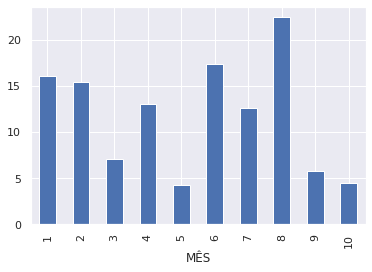

In [161]:
critical.groupby(['MÊS'])['diasemchuva'].mean().plot(kind="bar")

In [44]:
!conda install -c conda-forge folium=0.5.0 --yes
import folium

Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.9.1
  latest version: 4.9.2

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - folium=0.5.0


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    altair-4.1.0               |             py_1         614 KB  conda-forge
    attrs-20.3.0               |     pyhd3deb0d_0          41 KB  conda-forge
    branca-0.4.1               |             py_0          26 KB  conda-forge
    brotlipy-0.7.0             |py36he6145b8_1001         347 KB  conda-forge
    chardet-3.0.4              |py36h9880bd3_1008         194 KB  conda-forge
    cryptography-3.2.1         |   py36h6ec43e4

In [60]:
#Amazonas state directions
latitude = 3.10719
longitude = -60.0261

In [61]:
am_map = folium.Map(location=[latitude, longitude], zoom_start=5)

In [125]:
from folium import plugins

am_map = folium.Map(location=[latitude, longitude], zoom_start=5)
incidents = plugins.MarkerCluster().add_to(am_map)

for lat, lng, label, in zip(critical.latitude, critical.longitude, critical.Nivel_RiscoFogo):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

am_map

### Infrigement analysis

By the IBAMA's dataset(multas), we are observing the infringement by Flora.  The Brazilian Environmental Crimes Law defines infraction like destroying os damaging forests or other natural vegetation forms as "Flora".  Below, until preparing data, will be detailed this classification of infringement.

In [67]:
path2 = 'data/IBAMA_AUTO_INFRACAO.csv'
multas = pd.read_csv(path2, sep=';')

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3072: DtypeWarning: Columns (1,6,7,22,24,26,27,33,35,36,37) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [68]:
multas.dtypes

SEQ_AUTO_INFRACAO               float64
NUM_AUTO_INFRACAO                object
SER_AUTO_INFRACAO                object
TIPO_AUTO                        object
TIPO_MULTA                       object
VAL_AUTO_INFRACAO                object
PATRIMONIO_APURACAO              object
GRAVIDADE_INFRACAO               object
UNID_ARRECADACAO                 object
DES_AUTO_INFRACAO                object
DAT_HORA_AUTO_INFRACAO           object
FORMA_ENTREGA                    object
DAT_CIENCIA_AUTUACAO             object
COD_MUNICIPIO                     int64
MUNICIPIO                        object
UF                               object
NUM_PROCESSO                     object
COD_INFRACAO                      int64
DES_INFRACAO                     object
TIPO_INFRACAO                    object
NOME_INFRATOR                    object
CPF_CNPJ_INFRATOR                object
QTD_AREA                         object
INFRACAO_AREA                    object
DES_OUTROS_TIPO_AREA             object


In [69]:
multas['DAT_LANCAMENTO'] = pd.to_datetime(multas['DAT_LANCAMENTO'])

AM is the acronyms to Amazonas state. We will isolate the 2020 infringements in this state. 

In [72]:
multas = multas[multas["ANO"] == 2020]

In [73]:
multas = multas[multas["UF"] == "AM"]

In [92]:
multas['INFRINGEMENT'] = multas['TIPO_INFRACAO']
multas['DEFORASTATION'] = multas['INFRACAO_AREA']
multas['LATITUDE'] = multas['NUM_LATITUDE_AUTO']
multas['LONGITUDE'] = multas['NUM_LONGITUDE_AUTO']
multas['DATA'] = multas['DAT_LANCAMENTO']
multas['INFRINGEMENT_LOCAL'] = multas['DES_LOCAL_INFRACAO']
multas['AREA_GROUP'] = multas['CLASSIFICACAO_AREA']
multas['AUTUATION'] = multas['FORMA_ENTREGA']

In [96]:
multas = multas['DATA','LATITUDE', 'LONGITUDE', 'INFRINGEMENT', 'DEFORASTATION', 'INFRINGEMENT_LOCAL','AREA_GROUP', 'AUTUATION', 'MUNICIPIO' ] 

In [ ]:
multas['MÊS'] = multas['DATA'].dt.month

In [101]:
multas.head(3)

,DATA,LATITUDE,LONGITUDE,INFRINGEMENT,DEFORASTATION,INFRINGEMENT_LOCAL,AREA_GROUP,AUTUATION,MUNICIPIO,MÊS
590374,2020-06-01 12:48:00,"-7,55056","-63,0775",Penalidade pecuniária - Flora,Desmatamento,BR 230 com BR 319,NaN,Pessoalmente,HUMAITA,6
590377,2020-08-01 09:08:00,"-3,23667","-68,40944",Penalidade pecuniária - Outras,Desmatamento,"Comunidade Puretê, Rio Puretê",APP,Pessoalmente,SANTO ANTONIO DO ICA,8
590378,2020-01-14 12:36:00,"-3,13417","-59,98056",Penalidade pecuniária - Outras,Desmatamento,"Rua Ministro João Gonçalves de Souza, s/n°",NaN,AR,MANAUS,1


In [134]:
multas['LATITUDE'] = multas['LATITUDE'].str.replace(',','').astype(np.float64)
multas['LONGITUDE'] = multas['LONGITUDE'].str.replace(',','').astype(np.float64)

In [135]:
multas.dtypes

DATA                  datetime64[ns]
LATITUDE                     float64
LONGITUDE                    float64
INFRINGEMENT                  object
DEFORASTATION                 object
INFRINGEMENT_LOCAL            object
AREA_GROUP                    object
AUTUATION                     object
MUNICIPIO                     object
MÊS                            int64
DEFORASTATION_CODE             int64
INFRINGEMENT_CODE              int64
INFRINGEMENT_DESC             object
ASSESMENT                      int64
dtype: object

Desmatamento means deforestation in the Brazilian Portuguese language. Let's classify as "Desmatamento" and "Not Identified" to identify the "DEFORASTATION" group.  

In [103]:
multas['DEFORASTATION'].replace(np.nan, "NOT IDENTIFIED", inplace=True) 

In [104]:
multas['DEFORASTATION'].value_counts()

NOT IDENTIFIED    158
Desmatamento       41
Name: DEFORASTATION, dtype: int64

In [105]:
def get_status(multas):
    if multas['DEFORASTATION'] == "Desmatamento" :
        return 1    
    else:
        return 0

multas['DEFORASTATION_CODE'] = multas.apply(get_status, axis = 1)

All the infringements equal to "Flora" will be marked and then filtered to be identified on the map. 

In [111]:
def get_status(multas):
    if multas['INFRINGEMENT'] == "Penalidade pecuniária - Flora" :
        return 1    
    else:
        return 0

multas['INFRINGEMENT_CODE'] = multas.apply(get_status, axis = 1)

In [115]:
def get_status(multas):
    if multas['INFRINGEMENT'] == "Penalidade pecuniária - Flora" :
        return "Flora"    
    else:
        return "Others"

multas['INFRINGEMENT_DESC'] = multas.apply(get_status, axis = 1)

In [117]:
multas['ASSESMENT'] = 1

In [110]:
multas.groupby(['DEFORASTATION'])['INFRINGEMENT'].value_counts()

DEFORASTATION   INFRINGEMENT                                    
Desmatamento    Penalidade pecuniária - Flora                        24
                Penalidade pecuniária - Outras                       10
                Penalidade pecuniária - Fauna                         4
                Penalidade pecuniária - Cadastro Técnico Federal      2
                Penalidade pecuniária - Pesca                         1
NOT IDENTIFIED  Penalidade pecuniária - Flora                       106
                Penalidade pecuniária - Outras                       25
                Penalidade pecuniária - Fauna                        13
                Penalidade pecuniária - Controle ambiental            7
                Penalidade pecuniária - Pesca                         5
                Penalidade pecuniária - Unidades de conservação       2
Name: INFRINGEMENT, dtype: int64

<AxesSubplot:xlabel='INFRINGEMENT_DESC,MÊS'>

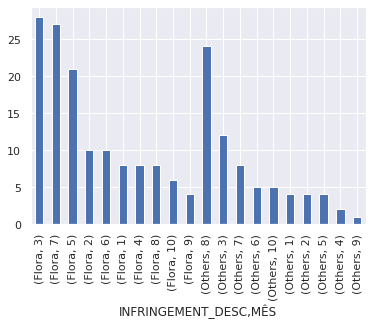

In [126]:
multas.groupby(['INFRINGEMENT_DESC'])['MÊS'].value_counts().plot(kind="bar")

In [136]:
incidents = plugins.MarkerCluster().add_to(am_map)

for lat, lng, label, in zip(multas.LATITUDE, multas.LONGITUDE, multas.INFRINGEMENT_DESC):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

am_map

Infringements have been applied in places near the critical fire risks.  

In [206]:
critical.head(3)

,datahora,satelite,pais,estado,município,bioma,diasemchuva,precipitacao,riscofogo,latitude,longitude,frp,Pop,Mesorregião,Microrregião,MÊS,ANO,SEMANA,HORA,Nivel_RiscoFogo
186,2020-01-27 17:30:00,AQUA_M-T,Brasil,AMAZONAS,PRESIDENTE FIGUEIREDO,Amazonia,2.0,0.3,0.4,-1.918,-60.101,11.2,36279,Centro,Rio Preto da Eva,1,2020,0,17,Critical
261,2020-02-19 17:35:00,AQUA_M-T,Brasil,AMAZONAS,BARCELOS,Amazonia,2.0,0.1,0.4,-1.365,-62.540,9.3,27502,Norte,Rio Negro,2,2020,2,17,Critical
281,2020-10-03 17:10:00,AQUA_M-T,Brasil,AMAZONAS,BARCELOS,Amazonia,10.0,0.0,0.7,1.273,-64.253,98.2,27502,Norte,Rio Negro,10,2020,5,17,Critical


In [214]:
critical['day'] = critical['diasemchuva'].astype(np.int64)

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [215]:
critical['day'].dtypes

dtype('int64')

In [217]:
Feature = critical[['day','Pop']]
Feature = pd.concat([Feature,pd.get_dummies(critical['Mesorregião'])], axis=1)
Feature.drop(['Centro'], axis = 1,inplace=True)
Feature.head()

,day,Pop,Norte,Sudoeste,Sul
186,2,36279,0,0,0
261,2,27502,1,0,0
281,10,27502,1,0,0
282,11,27502,1,0,0
283,10,27502,1,0,0


In [218]:
X = Feature
X[0:5]

,day,Pop,Norte,Sudoeste,Sul
186,2,36279,0,0,0
261,2,27502,1,0,0
281,10,27502,1,0,0
282,11,27502,1,0,0
283,10,27502,1,0,0


In [219]:
X= preprocessing.StandardScaler().fit(X).transform(X)
X[0:5]

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype uint8, int64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:1: DataConversionWarning: Data with input dtype uint8, int64 were all converted to float64 by StandardScaler.
  """Entry point for launching an IPython kernel.


array([[-0.95555069, -0.05409358, -0.04271788, -0.17739835, -2.07778519],
       [-0.95555069, -0.17187132, 23.40939982, -0.17739835, -2.07778519],
       [-0.37565486, -0.17187132, 23.40939982, -0.17739835, -2.07778519],
       [-0.30316788, -0.17187132, 23.40939982, -0.17739835, -2.07778519],
       [-0.37565486, -0.17187132, 23.40939982, -0.17739835, -2.07778519]])

In [220]:
y = critical['MÊS']

In [221]:
X= preprocessing.StandardScaler().fit(X).transform(X)
X[0:5]

array([[-0.95555069, -0.05409358, -0.04271788, -0.17739835, -2.07778519],
       [-0.95555069, -0.17187132, 23.40939982, -0.17739835, -2.07778519],
       [-0.37565486, -0.17187132, 23.40939982, -0.17739835, -2.07778519],
       [-0.30316788, -0.17187132, 23.40939982, -0.17739835, -2.07778519],
       [-0.37565486, -0.17187132, 23.40939982, -0.17739835, -2.07778519]])

In [222]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (3513, 5) (3513,)
Test set: (879, 5) (879,)


In [223]:
from sklearn.neighbors import KNeighborsClassifier
y_test
Ks = 10
mean_acc = np.zeros((Ks-1))
std_acc = np.zeros((Ks-1))
ConfustionMx = [];
for n in range(1,Ks):
    
    #Train Model and Predict  
    neigh = KNeighborsClassifier(n_neighbors = n).fit(X_train,y_train)
    yhat=neigh.predict(X_test)
    mean_acc[n-1] = metrics.accuracy_score(y_test, yhat)

    
    std_acc[n-1]=np.std(yhat==y_test)/np.sqrt(yhat.shape[0])

mean_acc

array([0.58134243, 0.58930603, 0.60295791, 0.62798635, 0.629124  ,
       0.63367463, 0.64960182, 0.64163823, 0.64277588])

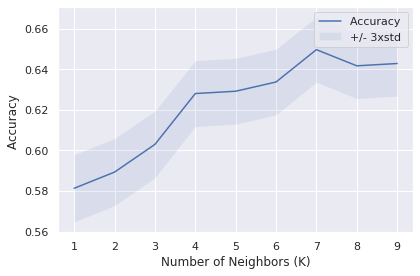

The best accuracy was with 0.6496018202502845 with k= 7


In [224]:
plt.plot(range(1,Ks),mean_acc)
plt.fill_between(range(1,Ks),mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
plt.tight_layout()
plt.show()

print( "The best accuracy was with", mean_acc.max(), "with k=", mean_acc.argmax()+1) 

neigh = KNeighborsClassifier(n_neighbors=mean_acc.argmax()+1).fit(X_train, y_train)

In [225]:
testScores = {}

In [226]:
#KNN
from sklearn.neighbors import KNeighborsClassifier

k = 7

neigh = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)
neigh

yhat = neigh.predict(X_test)
yhat[0:5]

from sklearn import metrics
print("Train set Accuracy: ", metrics.accuracy_score(y_train, neigh.predict(X_train)))
print("Test set Accuracy: ", metrics.accuracy_score(y_test, yhat)) #This function is equal to the jaccard_similarity_score function

Train set Accuracy:  0.717620267577569
Test set Accuracy:  0.6496018202502845


## SVM

In [237]:
feature_df = critical[['day','Pop']]
X = np.asarray(feature_df)
X[0:5]

array([[    2, 36279],
       [    2, 27502],
       [   10, 27502],
       [   11, 27502],
       [   10, 27502]])

In [238]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (3513, 2) (3513,)
Test set: (879, 2) (879,)


In [239]:
from sklearn import svm
clf = svm.SVC(kernel='rbf')
clf.fit(X_train, y_train) 

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)

In [240]:
yhat = clf.predict(X_test)
yhat [0:5]

array([7, 3, 8, 8, 8])

In [241]:
from sklearn.metrics import classification_report, confusion_matrix
import itertools

In [242]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')   

In [243]:
from sklearn.metrics import f1_score
f1_score(y_test, yhat, average='weighted') 

0.6742490397703172

In [244]:
from sklearn.metrics import jaccard_similarity_score
jaccard_similarity_score(y_test, yhat)

0.6848691695108078

## Results and Discussion <a id="4"></a>

The Amazon state has a rich ecosystem in the Amazon forest heart. In this same state, an urban population rises, building cities and living together to combat criminal forest exploration. 

Using K means algorithm set k value to 7, analyzing the mesoregions inside the state. Days without rain are closest associated with fire risk as like FRP and the biome destruction.
Observing the infringements in the same period, we could have opportunities to dedicated oversight to combat the fire in these cities and communities. 
The highest fire risk put in danger the Amazon forest ecosystem and the lives of the cities which grow up inside this forest. The possible path to combat the fire is a sustainable development of these cities and massive monitoring.

## Conclusion <a id="5"></a>
Environmental laws and strict enforcement are essential to support fighting fires that endanger the ecosystem of the Amazon rainforest. Within a single state, we see several crucial points in this combat, and the monitoring by the government and specialized institutions of Amazon forests is essential to avoid criminal fires. 